## SAM 3 Video Propagation vs. Naive Heuristic — EgoExo4D Comparison

Compares two tracking methods on a single-camera take:
1. **SAM 3 bi-directional mask propagation** — seed from the GT mask at a reference frame, propagate forward and backward.
2. **One-shot SAM 3 + centroids** — run SAM 3 image inference with a text prompt on every frame independently, then select the predicted mask whose centroid is closest to the reference frame mask centroid.

**Output:** per-frame IoU and overall IoU for both methods, plus side-by-side overlay visualisations.

## 1. Set-up

In [12]:
using_colab = False

In [13]:
if using_colab:
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib pycocotools
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/sam3.git'

In [14]:
import numpy as np
from pycocotools import mask as mask_util
from PIL import Image
import os
import torch
import json

In [15]:
# Device setup: MPS (macOS) > CUDA > CPU
if getattr(torch.backends, 'mps', None) and torch.backends.mps.is_available():
    device = torch.device('mps')
    torch.autocast('mps', dtype=torch.bfloat16).__enter__()
    print('Using MPS (Metal Performance Shaders) on macOS.')
elif torch.cuda.is_available():
    device = torch.device('cuda')
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True
    torch.autocast('cuda', dtype=torch.bfloat16).__enter__()
    print('Using CUDA.')
else:
    device = torch.device('cpu')
    print('Using CPU.')

torch.inference_mode().__enter__()

Using MPS (Metal Performance Shaders) on macOS.


In [16]:
from sam3.model_builder import build_sam3_video_model
from sam3.model.sam3_image_processor import Sam3Processor

# Build the video model — shared between both methods via tracker and detector
sam3_model = build_sam3_video_model()

# Tracker predictor for mask-seeded video propagation (Method 1)
tracker = sam3_model.tracker
tracker.backbone = sam3_model.detector.backbone

# Image processor for per-frame one-shot inference (Method 2)
# Reuses the detector from the same model — no second checkpoint load needed
image_processor = Sam3Processor(sam3_model.detector, confidence_threshold=0.3, device=device)

/Users/marcolomele/Documents/Repos/sam3/sam3/model_builder.py:8: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
/Users/marcolomele/Documents/Repos/sam3/sam3/model/sam3_video_inference.py:801: UserWarning: CUDA is not available or torch_xla is imported. Disabling autocast.
  @torch.autocast(device_type="cuda", dtype=torch.bfloat16)
/Users/marcolomele/Documents/Repos/sam3/sam3/model/sam3_video_inference.py:909: UserWarning: CUDA is not available or torch_xla is imported. Disabling autocast.
  @torch.autocast(device_type="cuda", dtype=torch.bfloat16)
/Users/marcolomele/Documents/Repos/sam3/sam3/model/sam3_tracking_predictor.py:50: UserWarning: CUDA is not available or torch_xla is imported. Disabling autocast.
  self.bf16_context = torch.autocast(device_type="cuda", dtype=to

### Helper Functions

In [17]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

plt.rcParams['axes.titlesize'] = 11
plt.rcParams['figure.titlesize'] = 11


def compute_iou(pred: np.ndarray, gt: np.ndarray) -> float:
    """Pixel-level IoU between two boolean arrays (auto-resizes pred to gt shape)."""
    if pred.shape != gt.shape:
        pred = np.array(
            Image.fromarray(pred.astype(np.uint8) * 255).resize(
                (gt.shape[1], gt.shape[0]), Image.NEAREST
            )
        ) > 127
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    return float(inter / union) if union > 0 else 0.0


def mask_centroid(mask: np.ndarray):
    """Return (row, col) centroid of a boolean mask, or None if the mask is empty."""
    ys, xs = np.where(mask)
    if len(ys) == 0:
        return None
    return float(ys.mean()), float(xs.mean())


def render_overlay(rgb: np.ndarray, pred: np.ndarray, gt: np.ndarray,
                   alpha: float = 0.45) -> np.ndarray:
    """Blend pred (red), gt (green), overlap (yellow) onto an RGB frame copy."""
    img = rgb.copy().astype(np.float32)
    if pred.shape != (rgb.shape[0], rgb.shape[1]):
        pred = np.array(
            Image.fromarray(pred.astype(np.uint8) * 255).resize(
                (rgb.shape[1], rgb.shape[0]), Image.NEAREST
            )
        ) > 127
    overlap   = pred & gt
    pred_only = pred & ~overlap
    gt_only   = gt  & ~overlap
    for mask, colour in [
        (gt_only,   np.array([0,   200,   0], dtype=np.float32)),
        (pred_only, np.array([220,   0,   0], dtype=np.float32)),
        (overlap,   np.array([255, 220,   0], dtype=np.float32)),
    ]:
        img[mask] = img[mask] * (1 - alpha) + colour * alpha
    return img.clip(0, 255).astype(np.uint8)


def plot_comparison(seq_idx, frame_num, sam3_pred, naive_pred, gt, rgb,
                    sam3_iou, naive_iou):
    """Side-by-side overlay plot for a single frame."""
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    for ax, pred, iou, title in [
        (axes[0], sam3_pred,  sam3_iou,  'SAM 3 Propagation'),
        (axes[1], naive_pred, naive_iou, 'One-shot + Centroids'),
    ]:
        ax.imshow(render_overlay(rgb, pred, gt))
        ax.set_title(f'{title}  (IoU = {iou:.3f})')
        ax.axis('off')
    axes[1].legend(
        handles=[
            mpatches.Patch(color=(0, 200/255, 0),    label='GT only'),
            mpatches.Patch(color=(220/255, 0, 0),     label='Pred only'),
            mpatches.Patch(color=(1.0, 220/255, 0),   label='Overlap'),
        ],
        loc='lower right', fontsize=8,
    )
    marker = '  ← reference' if seq_idx == ref_seq_idx else ''
    fig.suptitle(f'Frame {frame_num}  (seq {seq_idx}){marker}', y=1.01)
    plt.tight_layout()
    plt.show()

## 2. Configuration

Run the three sub-steps in order.  
Each step prints information that guides the choices in the next step.

### 2.1 — Data path

Set the root data directory and take ID, then run the cell to see **all available objects and cameras** in this take.

In [33]:
DATA_DIR = '/Users/marcolomele/Documents/Repos/sam3/data/test_mask_prop/'
TAKE_UID = '8acb2112-465c-4088-b502-65fd9704dd77'   # change to your take

ann_path = os.path.join(DATA_DIR, TAKE_UID, 'annotation.json')
with open(ann_path) as f:
    ann = json.load(f)

masks_by_obj = ann['masks']  # {object_name: {camera: {frame_str: rle}}}

# ── Print summary table ──────────────────────────────────────────────────────
col_obj  = max(len(k) for k in masks_by_obj) + 2
col_cams = 36
print(f'Take: {TAKE_UID}')
print(f'Scenario: {ann.get("scenario", "n/a")}  |  '
      f'Take name: {ann.get("take_name", "n/a")}')
print()
header = f'{"Object":<{col_obj}}  {"Cameras":<{col_cams}}  Frames  Range'
print(header)
print('-' * len(header))
for obj, cam_dict in sorted(masks_by_obj.items()):
    for cam, frame_dict in cam_dict.items():
        fnums = sorted(frame_dict.keys(), key=int)
        if len(fnums)>0:
            print(f'{obj:<{col_obj}}  {cam:<{col_cams}}  {len(fnums):>6}  '
                f'{fnums[0]} → {fnums[-1]}')
        else:
            print(f'{obj:<{col_obj}}  {cam:<{col_cams}}  {len(fnums):>6}  '
                f'na')
            

Take: 8acb2112-465c-4088-b502-65fd9704dd77
Scenario: Cooking Noodles  |  Take name: upenn_0712_Cooking_1_2

Object                     Cameras                               Frames  Range
------------------------------------------------------------------------------
black knife_0              aria01_214-1                             664  30 → 31860
black saucepan _0          gp03                                    1065  0 → 32100
black saucepan _0          aria01_214-1                             759  240 → 31860
celery package _0          gp01                                       0  na
celery package _0          aria01_214-1                              29  1890 → 26280
celery_0                   aria01_214-1                              15  26220 → 26670
celery_0                   gp02                                      13  26220 → 26670
cooked noodles_0           gp04                                      33  31140 → 32100
cooked noodles_0           aria01_214-1                    

### 2.2 — Object & camera selection

Pick an object and camera from the table above, then run the cell to see **per-frame mask coverage** for your selection.

In [34]:
OBJECT_NAME = 'black saucepan _0'    # ← pick from the table above
# CAMERA      = 'gp03'         # ← pick from the table above
CAMERA      = 'aria01_214-1'         # ← pick from the table above

assert OBJECT_NAME in masks_by_obj, f'Object "{OBJECT_NAME}" not found. Available: {list(masks_by_obj)}'
assert CAMERA in masks_by_obj[OBJECT_NAME], (
    f'Camera "{CAMERA}" not found for "{OBJECT_NAME}". '
    f'Available: {list(masks_by_obj[OBJECT_NAME])}'
)

frame_strs = sorted(masks_by_obj[OBJECT_NAME][CAMERA].keys(), key=int)
frame_nums = [int(f) for f in frame_strs]

# Measure mask coverage per frame (decode RLE, compute pixel fraction)
img0 = Image.open(os.path.join(DATA_DIR, TAKE_UID, CAMERA, f'{frame_strs[0]}.jpg'))
H, W = img0.height, img0.width
total_px = H * W

coverages = []   # (frame_num, seq_idx, n_px, pct)
for seq_idx, fstr in enumerate(frame_strs):
    rle  = masks_by_obj[OBJECT_NAME][CAMERA][fstr]
    m    = mask_util.decode(rle).astype(bool)
    # resize to image resolution if annotation was stored at a different resolution
    if m.shape != (H, W):
        m = np.array(Image.fromarray(m.astype(np.uint8) * 255).resize((W, H), Image.NEAREST)) > 127
    n_px = int(m.sum())
    coverages.append((int(fstr), seq_idx, n_px, 100.0 * n_px / total_px))

max_px  = max(c[2] for c in coverages)
mid_seq = len(coverages) // 2

print(f'Object : {OBJECT_NAME}')
print(f'Camera : {CAMERA}  |  Frame size: {W}×{H}  ({total_px:,} px)')
print(f'Frames : {len(frame_nums)}  ({frame_nums[0]} → {frame_nums[-1]})')
print()
print(f'{"Seq":>4}  {"Frame":>7}  {"Mask px":>9}  {"Coverage":>9}  Notes')
print('-' * 52)
for fn, si, n_px, pct in coverages:
    notes = []
    if si == mid_seq:      notes.append('← mid (default start)')
    if n_px == max_px:     notes.append('← largest mask')
    print(f'{si:>4}  {fn:>7}  {n_px:>9,}  {pct:>8.2f}%  {"  ".join(notes)}')

Object : black saucepan _0
Camera : aria01_214-1  |  Frame size: 448×448  (200,704 px)
Frames : 759  (240 → 31860)

 Seq    Frame    Mask px   Coverage  Notes
----------------------------------------------------
   0      240      1,716      0.85%  
   1      300      4,470      2.23%  
   2      330      4,522      2.25%  
   3      360      4,390      2.19%  
   4      390      4,707      2.35%  
   5      420      4,703      2.34%  
   6      450      4,826      2.40%  
   7      480      4,930      2.46%  
   8      510      4,139      2.06%  
   9      540      5,097      2.54%  
  10      570      4,210      2.10%  
  11      600        523      0.26%  
  12      660        386      0.19%  
  13      690      3,445      1.72%  
  14      720      3,252      1.62%  
  15      840      1,423      0.71%  
  16     1170        858      0.43%  
  17     1200      3,604      1.80%  
  18     1230      4,102      2.04%  
  19     1440        593      0.30%  
  20     1470        577    

### 2.3 — Experiment settings

Use the frame table above to pick `STARTING_FRAME_NUM` (or leave `None` for the mid-frame default).  
Set the text prompt for Method 2 and the visualisation stride.

Reference frame : 24630  (seq index 577 of 758)
Text prompt     : "kitchen utensil"
Vis stride      : every 50 frame(s)


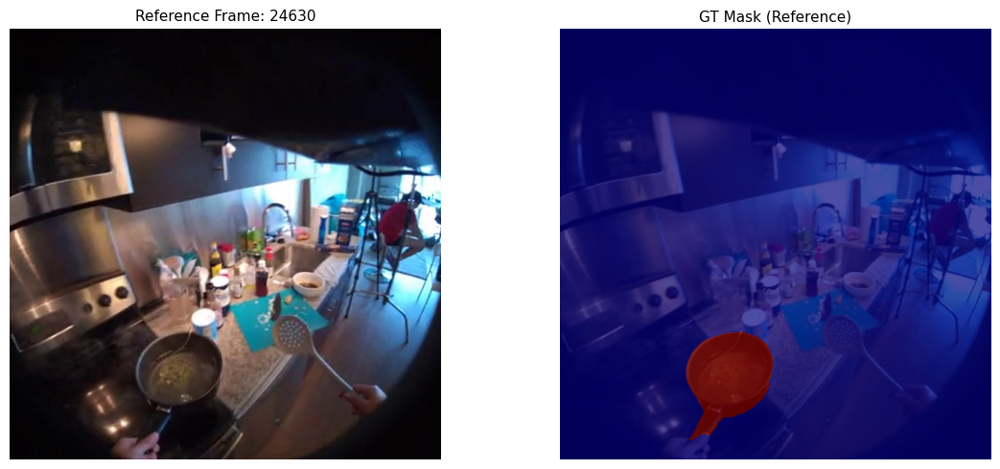

In [35]:
# Reference (salient) frame — set to None to auto-select the mid-sequence frame
STARTING_FRAME_NUM = 24630      # e.g. 5280

# Text prompt for Method 2 (one-shot SAM 3 + centroids)
TEXT_PROMPT = 'kitchen utensil'

# Show every N-th frame in the visualisation
VIS_STRIDE = 50

# ── Resolve reference frame ───────────────────────────────────────────────────
if STARTING_FRAME_NUM is None:
    STARTING_FRAME_NUM = frame_nums[len(frame_nums) // 2]

assert STARTING_FRAME_NUM in frame_nums, (
    f'STARTING_FRAME_NUM={STARTING_FRAME_NUM} not in annotated frames.\n'
    f'Available: {frame_nums}'
)
ref_seq_idx = frame_nums.index(STARTING_FRAME_NUM)

print(f'Reference frame : {STARTING_FRAME_NUM}  (seq index {ref_seq_idx} of {len(frame_nums) - 1})')
print(f'Text prompt     : "{TEXT_PROMPT}"')
print(f'Vis stride      : every {VIS_STRIDE} frame(s)')

# --- Plot reference frame and GT mask ---
import matplotlib.pyplot as plt

ref_frame_img_path = os.path.join(DATA_DIR, TAKE_UID, CAMERA, f'{STARTING_FRAME_NUM}.jpg')
ref_img = np.array(Image.open(ref_frame_img_path).convert('RGB'))

# Find GT mask if available
try:
    rle  = masks_by_obj[OBJECT_NAME][CAMERA][str(STARTING_FRAME_NUM)]
    ref_mask = mask_util.decode(rle).astype(bool)
    if ref_mask.shape != (H, W):
        ref_mask = np.array(
            Image.fromarray(ref_mask.astype(np.uint8) * 255).resize((W, H), Image.NEAREST)
        ) > 127
except Exception:
    ref_mask = np.zeros((H, W), dtype=bool)

plt.figure(figsize=(12, 5))
plt.subplot(1,2,1)
plt.title(f'Reference Frame: {STARTING_FRAME_NUM}')
plt.imshow(ref_img)
plt.axis('off')

plt.subplot(1,2,2)
plt.title('GT Mask (Reference)')
plt.imshow(ref_img)
plt.imshow(ref_mask, alpha=0.7, cmap='jet')
plt.axis('off')
plt.tight_layout()
plt.show()

## 3. Load Data

Loads all RGB frames and GT masks for the selected object, camera, and take.

In [10]:
print(f'Loading {len(frame_nums)} frames and GT masks...')

frames_rgb = {}   # frame_num -> np.ndarray (H, W, 3)
gt_masks   = {}   # frame_num -> bool np.ndarray (H, W)

for fstr, fn in zip(frame_strs, frame_nums):
    # RGB frame
    img_path = os.path.join(DATA_DIR, TAKE_UID, CAMERA, f'{fstr}.jpg')
    frames_rgb[fn] = np.array(Image.open(img_path).convert('RGB'))

    # GT mask (resize to image resolution if needed)
    rle  = masks_by_obj[OBJECT_NAME][CAMERA][fstr]
    mask = mask_util.decode(rle).astype(bool)
    if mask.shape != (H, W):
        mask = np.array(
            Image.fromarray(mask.astype(np.uint8) * 255).resize((W, H), Image.NEAREST)
        ) > 127
    gt_masks[fn] = mask

ref_gt_mask = gt_masks[STARTING_FRAME_NUM]
empty_mask  = np.zeros((H, W), dtype=bool)

print(f'Done.  Frame size: {W}×{H}')
print(f'GT mask at reference frame: {ref_gt_mask.sum():,} px  '
      f'({100*ref_gt_mask.mean():.2f}% of frame)')

Loading 759 frames and GT masks...
Done.  Frame size: 448×448
GT mask at reference frame: 6,693 px  (3.33% of frame)


## 4. Prepare Temp Video Directory

SAM 3's tracker expects a flat directory of sequentially numbered JPEGs.  
We copy the per-camera frames there in sorted order.

In [11]:
import shutil
import tempfile

tmp_video_dir = tempfile.mkdtemp(prefix='sam3_egoexo_')

for seq_idx, fstr in enumerate(frame_strs):
    src = os.path.join(DATA_DIR, TAKE_UID, CAMERA, f'{fstr}.jpg')
    dst = os.path.join(tmp_video_dir, f'{seq_idx:05d}.jpg')
    shutil.copy(src, dst)

print(f'Copied {len(frame_strs)} frames → {tmp_video_dir}')

Copied 759 frames → /var/folders/dv/g33k8m595hg3_ptcysrwx84h0000gn/T/sam3_egoexo_kx6d2u7z


## 5. Method 1 — SAM 3 Bi-directional Video Propagation

Seed the tracker with the GT mask at the reference frame, then propagate the full video in both directions and merge the results.

In [13]:
def collect_propagation_masks(tracker, inf_state, start_frame_idx, reverse, n_frames):
    """Run propagation and return {seq_idx: bool mask} for all yielded frames."""
    masks = {}
    for frame_idx, _, _, vrm, _ in tracker.propagate_in_video(
        inf_state,
        start_frame_idx=start_frame_idx,
        max_frame_num_to_track=n_frames,
        reverse=reverse,
        propagate_preflight=True,
    ):
        masks[frame_idx] = (vrm[0] > 0.0).cpu().numpy().squeeze()
    return masks


mask_tensor = torch.tensor(ref_gt_mask.astype(np.float32))   # (H, W) float
n_frames    = len(frame_nums)

# ── Forward: reference → last frame ──────────────────────────────────────────
inf_state_fwd = tracker.init_state(video_path=tmp_video_dir)
tracker.add_new_mask(inference_state=inf_state_fwd, frame_idx=ref_seq_idx, obj_id=1, mask=mask_tensor)
sam3_masks_fwd = collect_propagation_masks(tracker, inf_state_fwd, ref_seq_idx, reverse=False, n_frames=n_frames)
print(f'Forward:  {len(sam3_masks_fwd)} frames  (seq {min(sam3_masks_fwd)} → {max(sam3_masks_fwd)})')

# ── Backward: reference → first frame ────────────────────────────────────────
inf_state_bwd = tracker.init_state(video_path=tmp_video_dir)
tracker.add_new_mask(inference_state=inf_state_bwd, frame_idx=ref_seq_idx, obj_id=1, mask=mask_tensor)
sam3_masks_bwd = collect_propagation_masks(tracker, inf_state_bwd, ref_seq_idx, reverse=True, n_frames=n_frames)
print(f'Backward: {len(sam3_masks_bwd)} frames  (seq {min(sam3_masks_bwd)} → {max(sam3_masks_bwd)})')

# ── Merge ─────────────────────────────────────────────────────────────────────
sam3_pred_masks = {
    i: (sam3_masks_bwd if i < ref_seq_idx else sam3_masks_fwd).get(i, empty_mask)
    for i in range(n_frames)
}
print(f'Merged:   {len(sam3_pred_masks)} frames total')

frame loading (JPEG): 100%|██████████| 759/759 [00:07<00:00, 106.04it/s]


propagate in video:   0%|          | 0/182 [00:00<?, ?it/s]

Forward:  182 frames  (seq 577 → 758)


frame loading (JPEG): 100%|██████████| 759/759 [00:06<00:00, 113.38it/s]


propagate in video:   0%|          | 0/578 [00:00<?, ?it/s]

Backward: 578 frames  (seq 0 → 577)
Merged:   759 frames total


## 6. Method 2 — One-shot SAM 3 + Centroids

For every frame:
1. Run SAM 3 image inference with `TEXT_PROMPT` → candidate masks.
2. Select the candidate whose centroid is closest to the **reference frame GT mask centroid** (fixed across all frames).

In [12]:
ref_centroid = mask_centroid(ref_gt_mask)
print(f'Reference centroid : row={ref_centroid[0]:.1f}, col={ref_centroid[1]:.1f}')
print(f'Text prompt        : "{TEXT_PROMPT}"')
print(f'Confidence thresh  : {image_processor.confidence_threshold}')
print()
print(f'{"Seq":>4}  {"Frame":>7}  {"Cands":>5}  {"Sel#":>4}  {"Score":>6}  {"Dist(px)":>9}  {"SelCentroid(r,c)":>20}  Status')
print('-' * 82)

naive_pred_masks = {}   # seq_idx -> bool array (H×W)

for seq_idx, (fstr, fn) in enumerate(zip(frame_strs, frame_nums)):
    img_pil = Image.open(
        os.path.join(DATA_DIR, TAKE_UID, CAMERA, f'{fstr}.jpg')
    ).convert('RGB')

    state = image_processor.set_image(img_pil)
    state = image_processor.set_text_prompt(TEXT_PROMPT, state)

    candidate_masks  = state.get('masks')    # (N, 1, H, W) bool tensor | None
    candidate_scores = state.get('scores')   # (N,) float tensor | None

    ref_marker = ' ← ref' if seq_idx == ref_seq_idx else ''

    if candidate_masks is None or candidate_masks.shape[0] == 0:
        naive_pred_masks[seq_idx] = empty_mask
        print(f'{seq_idx:>4}  {fn:>7}  {"0":>5}  {"-":>4}  {"—":>6}  {"—":>9}  {"—":>20}  no candidates{ref_marker}')
        continue

    n = candidate_masks.shape[0]

    # Score each candidate by centroid distance to the fixed reference centroid
    best_mask  = None
    best_dist  = float('inf')
    best_idx   = -1
    best_score = 0.0
    best_c     = None

    for k in range(n):
        m = candidate_masks[k, 0].cpu().numpy()   # bool (H, W)
        c = mask_centroid(m)
        if c is None:
            continue
        dist = ((c[0] - ref_centroid[0]) ** 2 + (c[1] - ref_centroid[1]) ** 2) ** 0.5
        if dist < best_dist:
            best_dist  = dist
            best_mask  = m
            best_idx   = k
            best_score = float(candidate_scores[k]) if candidate_scores is not None else float('nan')
            best_c     = c

    naive_pred_masks[seq_idx] = best_mask if best_mask is not None else empty_mask

    c_str  = f'({best_c[0]:.1f}, {best_c[1]:.1f})' if best_c else '—'
    status = 'OK' + ref_marker if best_mask is not None else 'empty'
    print(f'{seq_idx:>4}  {fn:>7}  {n:>5}  {best_idx:>4}  {best_score:>6.3f}  {best_dist:>9.1f}  {c_str:>20}  {status}')

print()
print('One-shot inference complete.')

Reference centroid : row=361.9, col=174.4
Text prompt        : "kitchen utensil"
Confidence thresh  : 0.3

 Seq    Frame  Cands  Sel#   Score   Dist(px)      SelCentroid(r,c)  Status
----------------------------------------------------------------------------------
   0      240     31    24   0.549       33.4        (370.7, 206.6)  OK
   1      300     14     9   0.850       32.3        (377.7, 202.5)  OK
   2      330     22     8   0.459       43.8        (332.7, 207.1)  OK
   3      360     23    17   0.370       53.6        (326.6, 214.7)  OK
   4      390     20    13   0.541       65.3        (304.1, 204.9)  OK
   5      420     18    15   0.404       71.9        (317.2, 230.8)  OK
   6      450     22    20   0.477       69.6        (314.6, 225.5)  OK
   7      480     25    22   0.468       67.5        (321.7, 228.7)  OK
   8      510     26    10   0.880       75.2        (362.6, 249.6)  OK
   9      540     28     8   0.436       60.2        (301.8, 178.8)  OK
  10      570 

## 7. IoU Computation

In [15]:
sam3_iou_per_frame  = {}   # frame_num -> float
naive_iou_per_frame = {}   # frame_num -> float

for seq_idx, fn in enumerate(frame_nums):
    gt = gt_masks[fn]
    sam3_iou_per_frame[fn]  = compute_iou(sam3_pred_masks[seq_idx],  gt)
    naive_iou_per_frame[fn] = compute_iou(naive_pred_masks[seq_idx], gt)

sam3_mean_iou  = float(np.mean(list(sam3_iou_per_frame.values())))
naive_mean_iou = float(np.mean(list(naive_iou_per_frame.values())))

print('=' * 57)
print(f'  Method 1 — SAM 3 Propagation      mean IoU: {sam3_mean_iou:.4f}')
print(f'  Method 2 — One-shot + Centroids   mean IoU: {naive_mean_iou:.4f}')
print('=' * 57)
winner = 'Method 1' if sam3_mean_iou >= naive_mean_iou else 'Method 2'
delta  = abs(sam3_mean_iou - naive_mean_iou)
print(f'  {winner} wins by {delta:.4f} IoU points.')

  Method 1 — SAM 3 Propagation      mean IoU: 0.4585
  Method 2 — One-shot + Centroids   mean IoU: 0.0534
  Method 1 wins by 0.4052 IoU points.


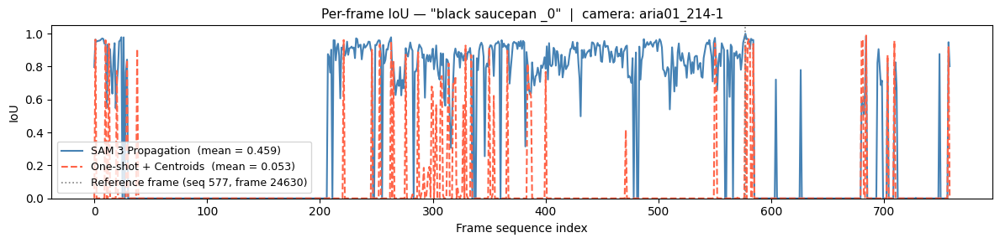

In [16]:
# Per-frame IoU curve
fig, ax = plt.subplots(figsize=(12, 3))
xs = list(range(len(frame_nums)))
ax.plot(xs, [sam3_iou_per_frame[fn]  for fn in frame_nums],
        label=f'SAM 3 Propagation  (mean = {sam3_mean_iou:.3f})',
        color='steelblue', linewidth=1.5)
ax.plot(xs, [naive_iou_per_frame[fn] for fn in frame_nums],
        label=f'One-shot + Centroids  (mean = {naive_mean_iou:.3f})',
        color='tomato', linestyle='--', linewidth=1.5)
ax.axvline(ref_seq_idx, color='gray', linestyle=':', linewidth=1.2,
           label=f'Reference frame (seq {ref_seq_idx}, frame {STARTING_FRAME_NUM})')
ax.set_xlabel('Frame sequence index')
ax.set_ylabel('IoU')
ax.set_ylim(0, 1.05)
ax.set_title(f'Per-frame IoU — "{OBJECT_NAME}"  |  camera: {CAMERA}')
ax.legend(fontsize=9)
plt.tight_layout()
plt.show()

## 8. Visualisation — Side-by-side Overlays

Predicted mask = **red** · GT mask = **green** · Overlap = **yellow**  
Frames are shown every `VIS_STRIDE` step(s).

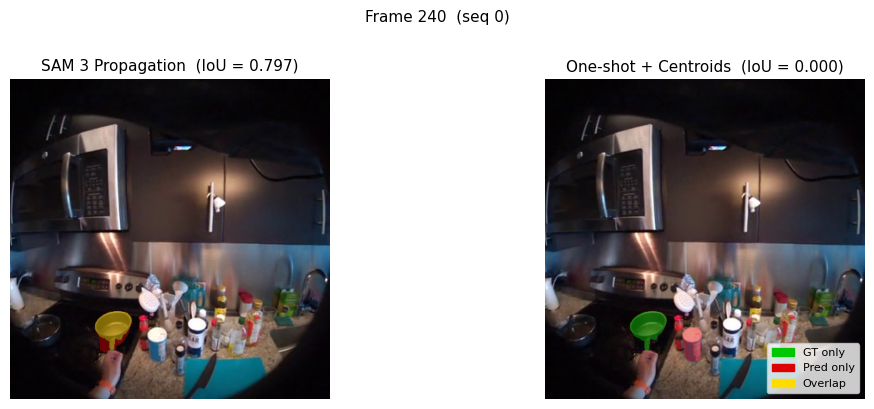

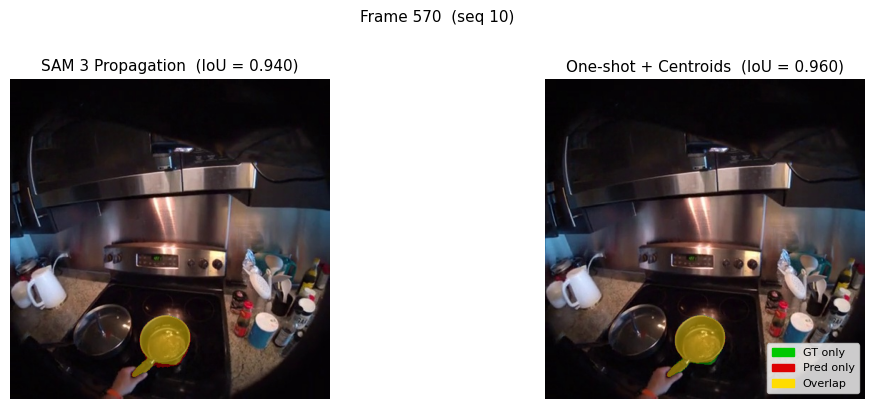

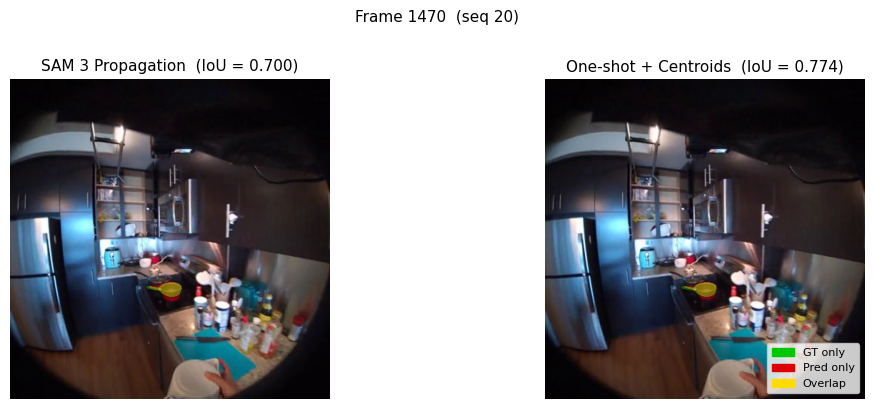

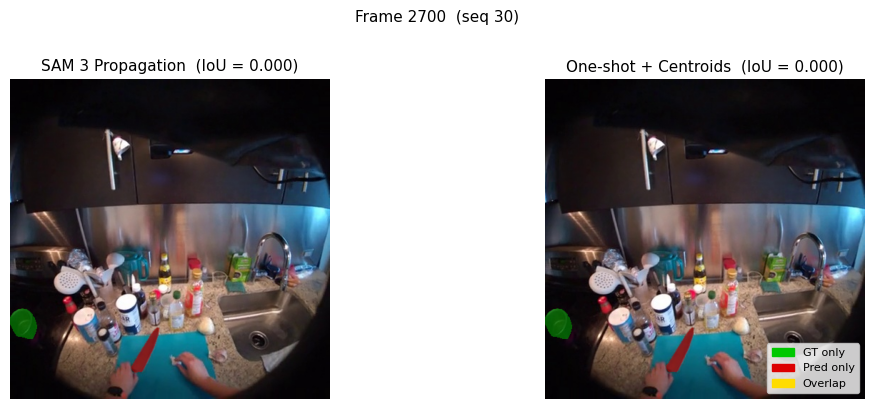

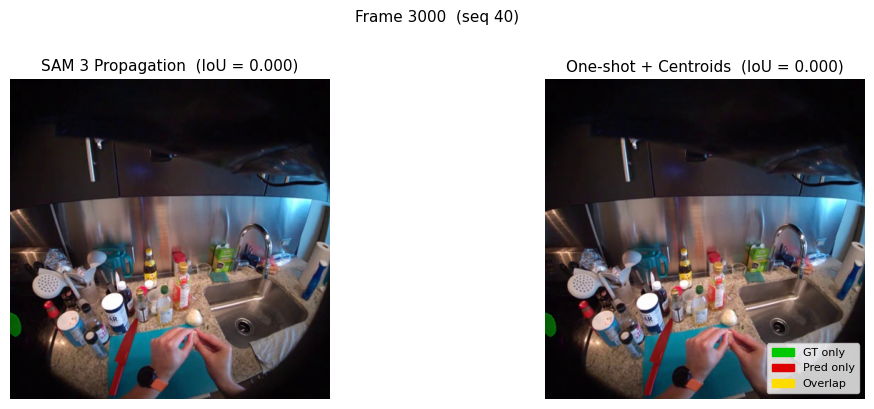

...

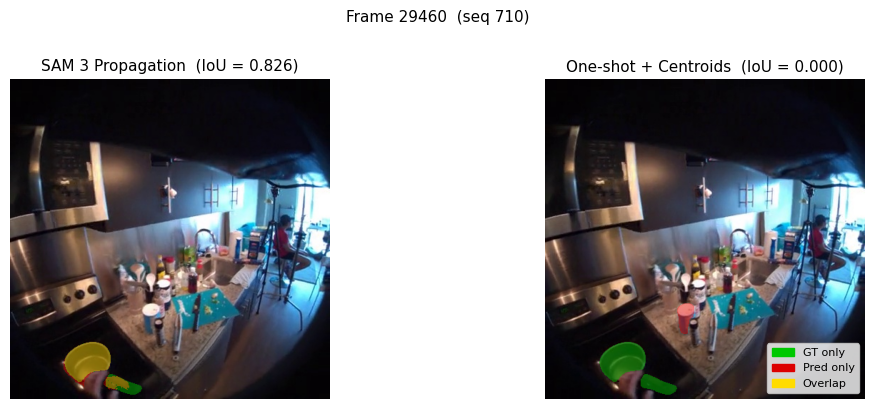

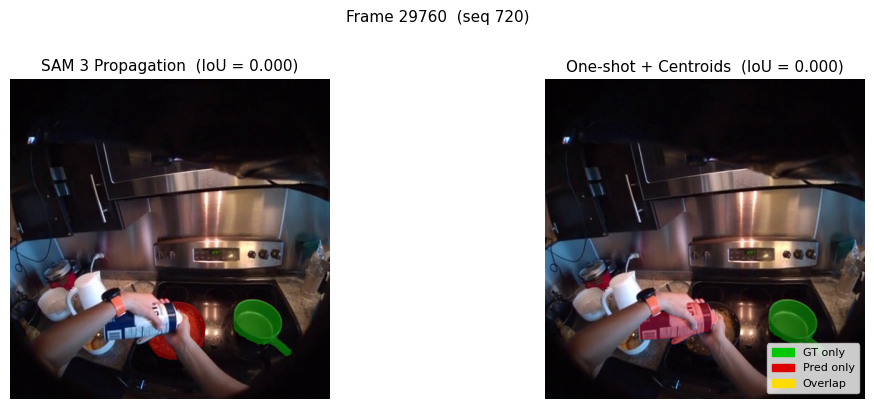

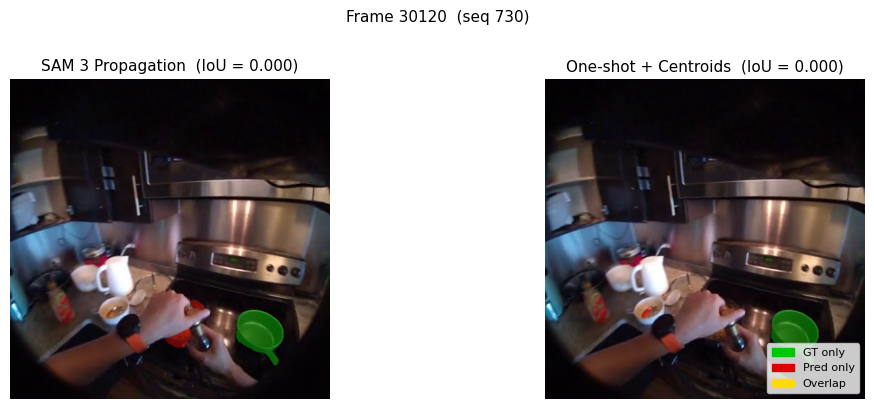

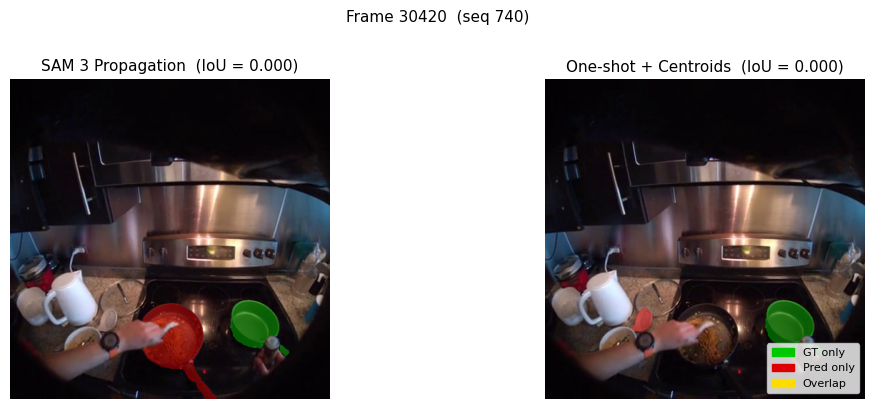

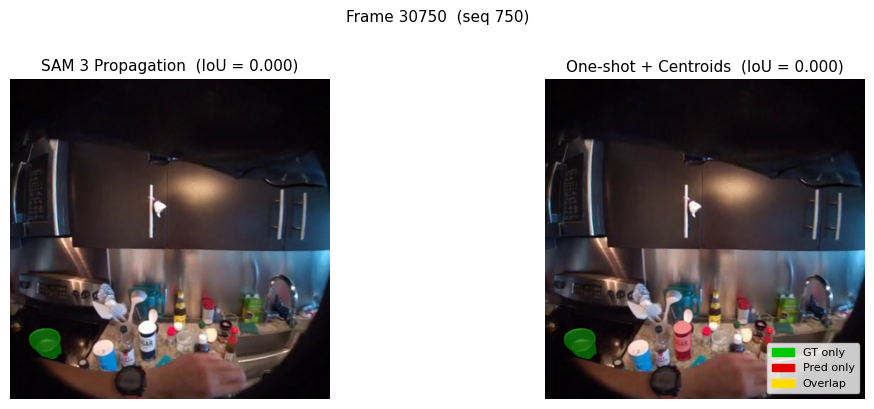

In [18]:
for seq_idx in range(0, len(frame_nums), 10):
    fn = frame_nums[seq_idx]
    plot_comparison(
        seq_idx=seq_idx,
        frame_num=fn,
        sam3_pred=sam3_pred_masks[seq_idx],
        naive_pred=naive_pred_masks[seq_idx],
        gt=gt_masks[fn],
        rgb=frames_rgb[fn],
        sam3_iou=sam3_iou_per_frame[fn],
        naive_iou=naive_iou_per_frame[fn],
    )

## 9. Clean-up

Remove the temporary video directory and free GPU resources.

In [20]:
shutil.rmtree(tmp_video_dir, ignore_errors=True)
print(f'Removed {tmp_video_dir}')

del inf_state_fwd, inf_state_bwd
import gc
gc.collect()
if device.type == 'cuda':
    torch.cuda.empty_cache()
print('Done.')

Removed /var/folders/dv/g33k8m595hg3_ptcysrwx84h0000gn/T/sam3_egoexo_zfp771r5
Done.
